# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

this step we gather the object points and image points as 2 lists with multiple chessboard images.

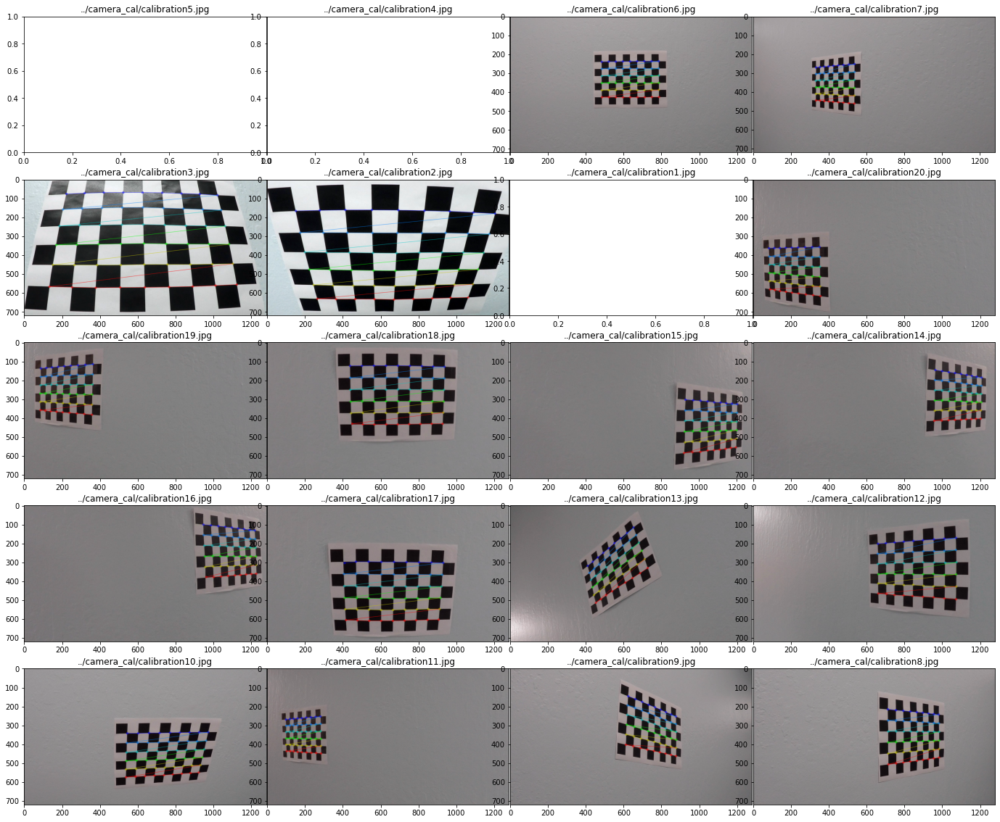

In [1044]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

fig, axs = plt.subplots(5,4, figsize=(24, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    axs[i].set_title(fname)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].imshow(img)

## Select one image and try to undistort it

compute the distortion matrix by using the objpoints and imgpoints, and undistort the image, example showing below:

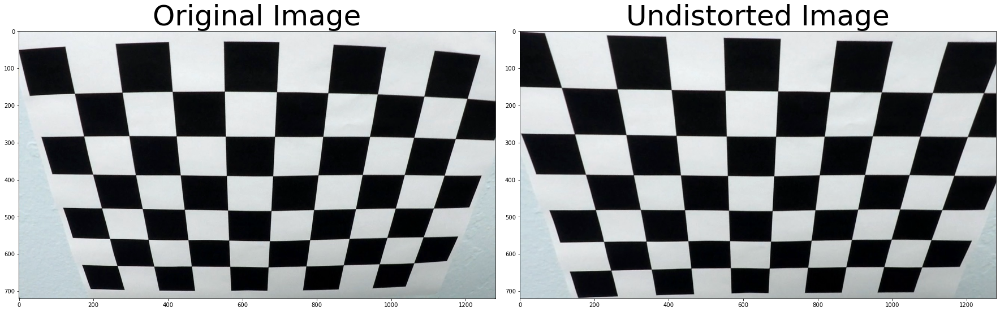

In [1045]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

img = cv2.imread('../camera_cal/calibration2.jpg')
undist, mtx, dist = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

as shown above, the image on the upper-right side is successfully undistored.

### Select one road image and apply undistortion

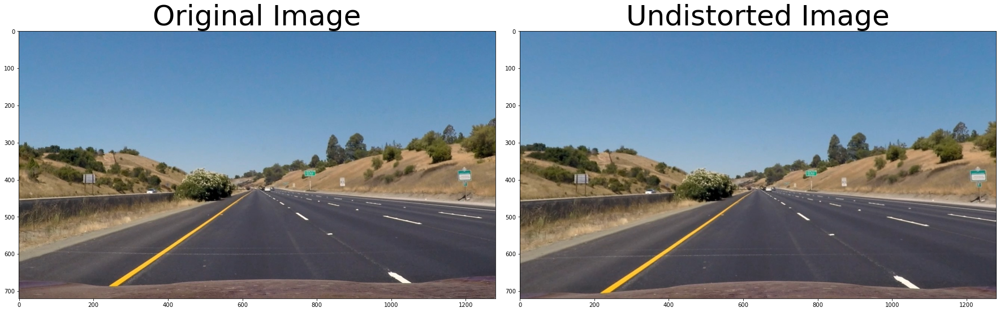

In [1046]:
img_1 = cv2.imread('../test_images/straight_lines1.jpg')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
undist = cv2.undistort(img_1, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_1)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective Transformation

similar to the code in quizzes, we find 4 points closing to 4 edges of the chessboard image, and then map it to 4 points we assigned, to make the chessboard in a top-down angle.

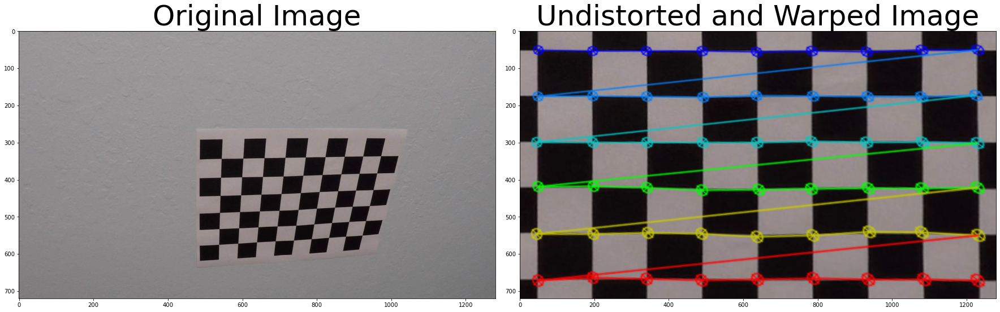

In [1047]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_size = (undist.shape[1], undist.shape[0])
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # 4) If corners found: 
    if ret == True:
            # a) draw corners
            corners_image = cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
            # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
                 #Note: you could pick any four of the detected corners 
                 # as long as those four corners define a rectangle
                 #One especially smart way to do this would be to use four well-chosen
                 # corners that were automatically detected during the undistortion steps
                 #We recommend using the automatic detection of corners in your code
                
            offset = 50
            src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
            dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
            M = cv2.getPerspectiveTransform(src, dst)
            # # e) use cv2.warpPerspective() to warp your image to a top-down view
            warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M


img = cv2.imread('../camera_cal/calibration10.jpg')
top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### to apply undistortion and perspective transformation on a stright line image, to make the 2 lanes looks vertically and in parallel.

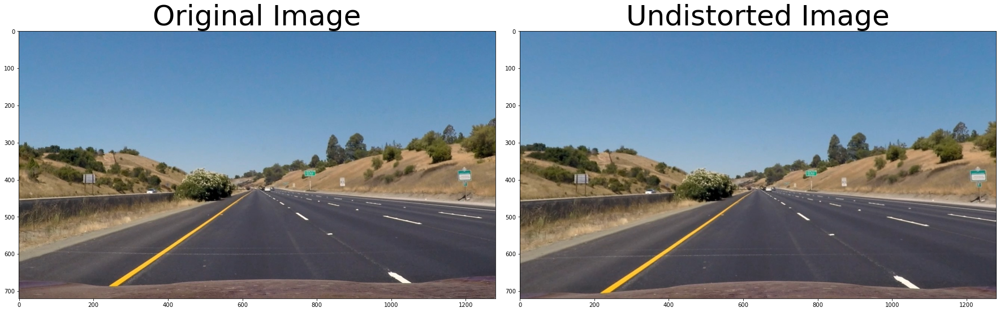

In [1070]:
img_1 = cv2.imread('../test_images/straight_lines1.jpg')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
undist = cv2.undistort(img_1, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_1)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### To set the region perspective rectangle, and then apply the persective transformation

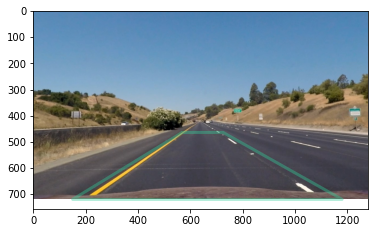

In [1071]:
h,w = undist.shape[:2]

src = np.float32([(569,464),
                  (725,464), 
                  (150,720), 
                  (1180,720)])
dst = np.float32([(460,0),
                  (w-460,0),
                  (460,h),
                  (w-460,h)])

# Visualize unwarp
plt.imshow(undist)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
plt.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)

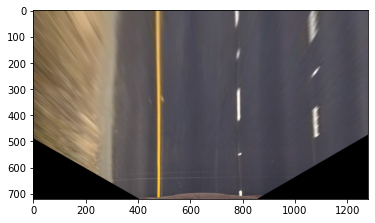

In [1072]:
def unwarp(img, src, dst):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    img_size = (img.shape[1], img.shape[0])
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

unwarped_image, M, Minv = unwarp(undist, src, dst)
plt.imshow(unwarped_image)

now we can see the straight line image is transformed to visualize 2 parallel lines. 

## Region of interest

to apply the region of interest mask to get rid of useless information 

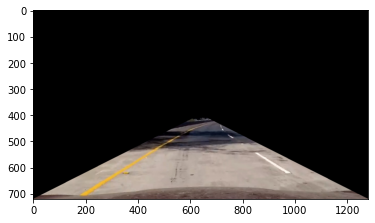

In [1073]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

img_1 = cv2.imread('../test_images/test5.jpg')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)

img = cv2.undistort(img_1, mtx, dist, None, mtx)
h,w = img.shape[:2]

interest = region_of_interest(img,
            [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
                dtype=np.int32)]
            )

plt.imshow(interest)

## Gradients and Color Spaces

### visualize colorspace channels

to compare the performance, we use a rather complicated example, test5.jpg

Text(0.5, 1.0, 'LAB B-channel')

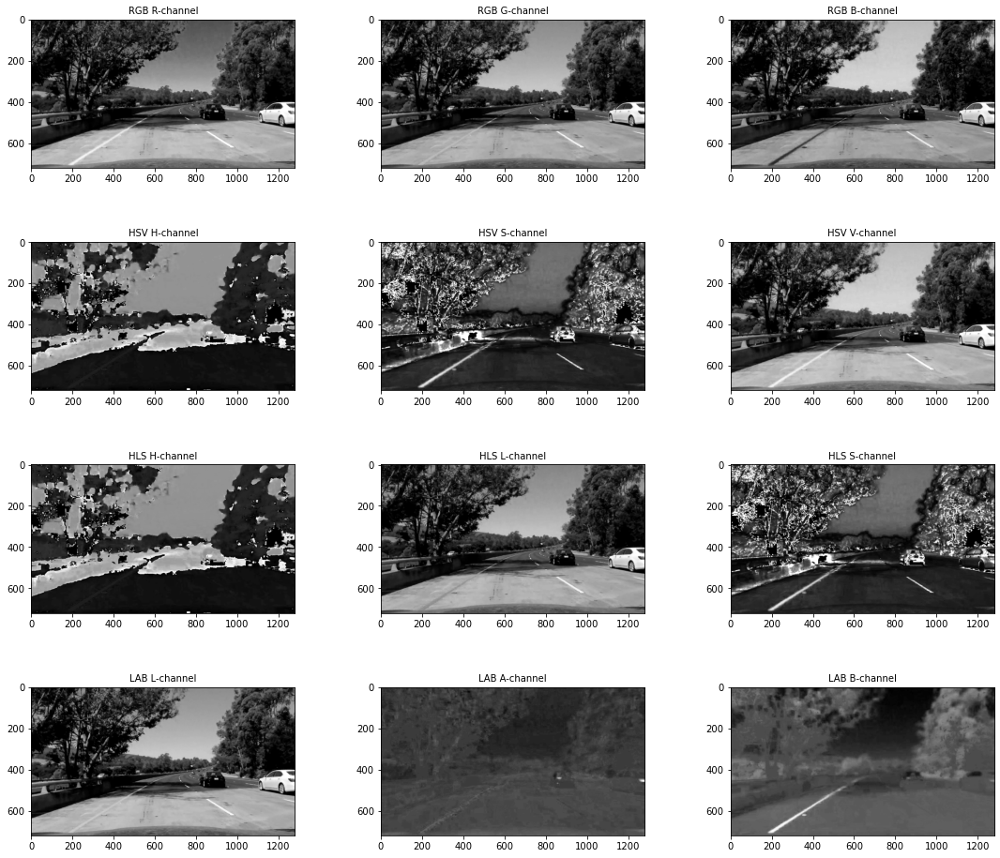

In [1074]:
image_red = img[:,:,0]
image_green = img[:,:,1]
image_blue = img[:,:,2]
image_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
image_H = image_HSV[:,:,0]
image_S = image_HSV[:,:,1]
image_V = image_HSV[:,:,2]
image_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
image_H_1 = image_HLS[:,:,0]
image_L = image_HLS[:,:,1]
image_S = image_HLS[:,:,2]

image_LAB = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
image_LL = image_LAB[:,:,0]
image_AA = image_LAB[:,:,1]
image_BB = image_LAB[:,:,2]

fig, axs = plt.subplots(4,3, figsize=(20, 16))
fig.subplots_adjust(hspace = .5, wspace=.005)
axs = axs.ravel()
axs[0].imshow(image_red, cmap='gray')
axs[0].set_title('RGB R-channel', fontsize=10)
axs[1].imshow(image_green, cmap='gray')
axs[1].set_title('RGB G-channel', fontsize=10)
axs[2].imshow(image_blue, cmap='gray')
axs[2].set_title('RGB B-channel', fontsize=10)

axs[3].imshow(image_H, cmap='gray')
axs[3].set_title('HSV H-channel', fontsize=10)
axs[4].imshow(image_S, cmap='gray')
axs[4].set_title('HSV S-channel', fontsize=10)
axs[5].imshow(image_V, cmap='gray')
axs[5].set_title('HSV V-channel', fontsize=10)

axs[6].imshow(image_H_1, cmap='gray')
axs[6].set_title('HLS H-channel', fontsize=10)
axs[7].imshow(image_L, cmap='gray')
axs[7].set_title('HLS L-channel', fontsize=10)
axs[8].imshow(image_S, cmap='gray')
axs[8].set_title('HLS S-channel', fontsize=10)


axs[9].imshow(image_LL, cmap='gray')
axs[9].set_title('LAB L-channel', fontsize=10)
axs[10].imshow(image_AA, cmap='gray')
axs[10].set_title('LAB A-channel', fontsize=10)
axs[11].imshow(image_BB, cmap='gray')
axs[11].set_title('LAB B-channel', fontsize=10)

#### Try to tune the L-channel image in HLS space.

interactive(children=(IntSlider(value=190, description='min_thresh', max=255), IntSlider(value=255, descriptio…

<function __main__.update(min_thresh=190, max_thresh=255)>

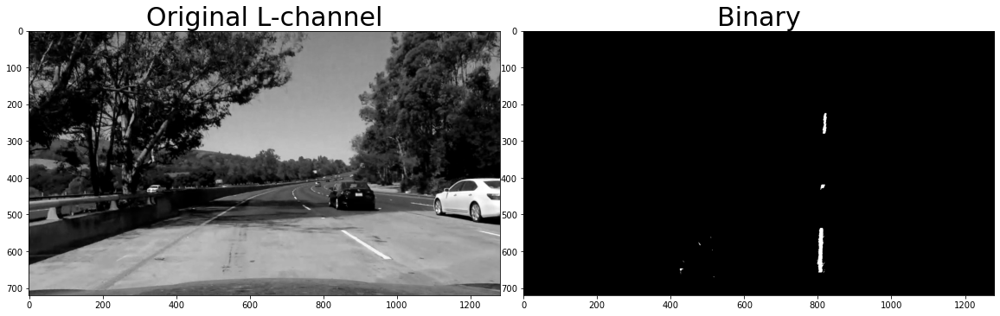

In [1075]:
from ipywidgets import interact, interactive, fixed

def get_binary_image(img, min_thresh=150, max_thresh=255):
    thresh = (min_thresh, max_thresh)
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary

def update(min_thresh=190, max_thresh=255):
    img = get_binary_image(image_L, min_thresh, max_thresh)
    img = region_of_interest(img,
            [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
                dtype=np.int32)]
            )
    binary, M, Minv = unwarp(img, src, dst)
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image_L, cmap='gray')
    ax1.set_title('Original L-channel', fontsize=30)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary', fontsize=30)

interact(update, min_thresh=(0,255), 
                 max_thresh=(0,255))

from the example above, we can see the white lane could be detected but yellow lane on the left side of the original image is lost.

#### Try to tune the S-channel image in HLS space.

interactive(children=(IntSlider(value=190, description='min_thresh', max=255), IntSlider(value=220, descriptio…

<function __main__.update(min_thresh=190, max_thresh=220)>

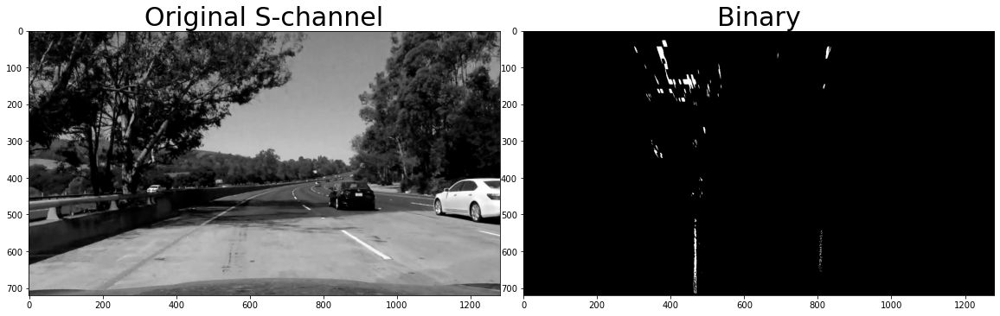

In [1076]:
def get_binary_image(img, min_thresh=170, max_thresh=220):
    thresh = (min_thresh, max_thresh)
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary

def update(min_thresh=190, max_thresh=220):
    img = get_binary_image(image_S, min_thresh, max_thresh)
    img = region_of_interest(img,
            [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
                dtype=np.int32)]
            )
    binary, M, Minv = unwarp(img, src, dst)
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image_L, cmap='gray')
    ax1.set_title('Original S-channel', fontsize=30)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary', fontsize=30)

interact(update, min_thresh=(0,255), 
                 max_thresh=(0,255))

It seems S-channel did a better job in detecting both lanes, but the shadow from the left blurred the left lane.

#### Try to tune the V-channel image in HSV space.

interactive(children=(IntSlider(value=215, description='min_thresh', max=255), IntSlider(value=255, descriptio…

<function __main__.update(min_thresh=215, max_thresh=255)>

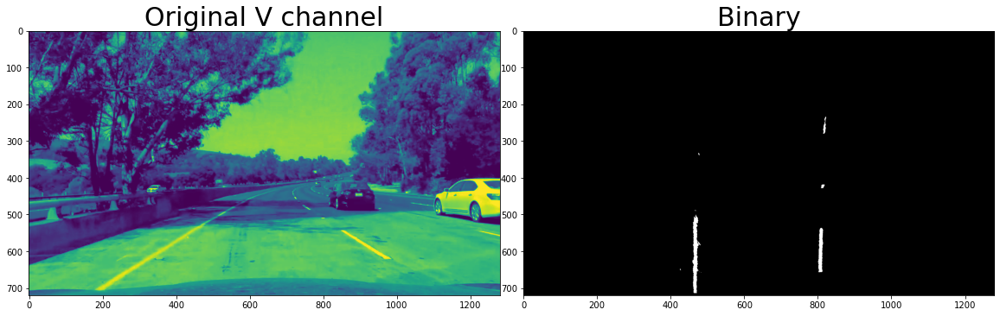

In [1077]:
def get_binary_image(img, min_thresh=215, max_thresh=255):
    thresh = (min_thresh, max_thresh)
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary

def update(min_thresh=215, max_thresh=255):
    image = get_binary_image(image_V, min_thresh, max_thresh)
    img = region_of_interest(image,
            [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
                dtype=np.int32)]
            )
    image, M, Minv = unwarp(img, src, dst)
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image_V)
    ax1.set_title('Original V channel', fontsize=30)
    ax2.imshow(image, cmap='gray')
    ax2.set_title('Binary', fontsize=30)

interact(update, min_thresh=(0,255), 
                 max_thresh=(0,255))

V-channel looks nice in handling both lanes.

#### Try to tune the Red channel image in RGB space.

interactive(children=(IntSlider(value=215, description='min_thresh', max=255), IntSlider(value=255, descriptio…

<function __main__.update(min_thresh=215, max_thresh=255)>

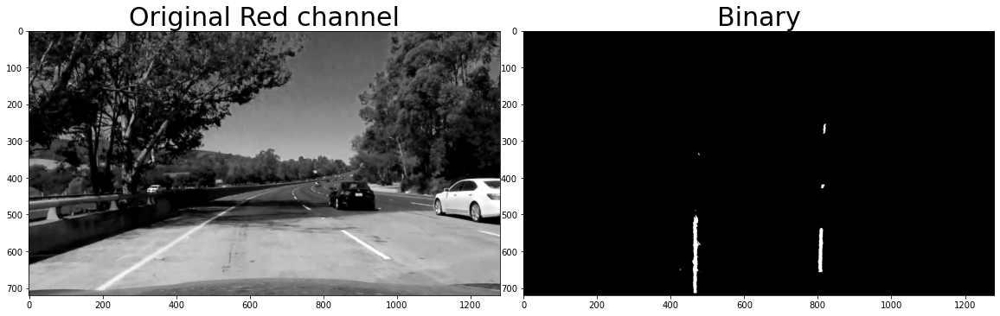

In [1078]:
def get_binary_image(img, min_thresh=215, max_thresh=255):
    thresh = (min_thresh, max_thresh)
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
#     binary, M, Minv = unwarp(binary, src, dst)
    return binary

def update(min_thresh=215, max_thresh=255):
    image = get_binary_image(image_red, min_thresh, max_thresh)
    img = region_of_interest(image,
            [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
                dtype=np.int32)]
            )
    image, M, Minv = unwarp(img, src, dst)
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(image_red, cmap='gray')
    ax1.set_title('Original Red channel', fontsize=30)
    ax2.imshow(image, cmap='gray')
    ax2.set_title('Binary', fontsize=30)

interact(update, min_thresh=(0,255), 
                 max_thresh=(0,255))

As for red channel, the conclusion is similar that it detects the white lanes fairly well.

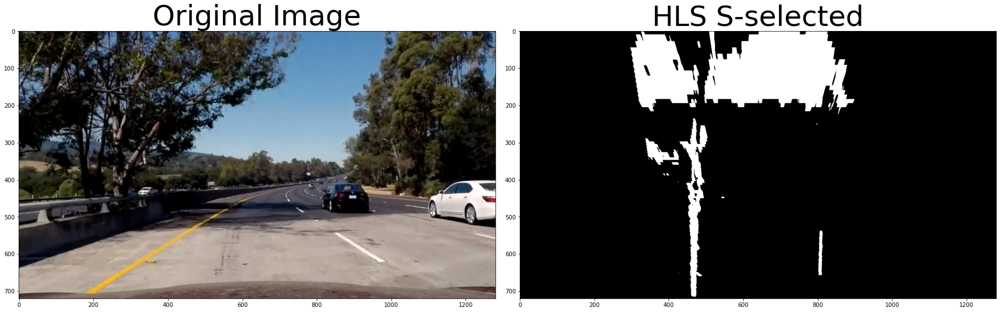

In [1079]:
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary
    
# Optional TODO - tune the threshold to try to match the above image!    
hls_binary = hls_select(img, thresh=(80, 255))

hls_binary = region_of_interest(hls_binary,
        [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
hls_binary, M, Minv = unwarp(hls_binary, src, dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('HLS S-selected', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

on the function above, we set the threshold similar to the experiment did in the lecture. However, it looks pretty bad because of the shadow, so we might choose not to use S-channel as the source image, or we could use another image and use & to get rid of the noise.

### assemble multiple color-thresholding strategy with region of interest and then unwarp the image, to see how it looks now

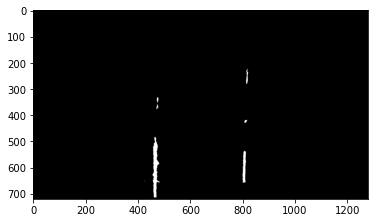

In [1080]:
image_binary_L = get_binary_image(image_L, 205, 255)
# or 
image_binary_V = get_binary_image(image_V, 205, 255)
# or
image_binary_red = get_binary_image(image_red, 220, 255)

image_binary_S = hls_select(img, thresh=(80, 255))


combined_binary = np.zeros_like(image_binary_red)
combined_binary[((image_binary_V == 1) & (image_binary_S == 1)) | (image_binary_L == 1) | (image_binary_red == 1)] = 1

img = region_of_interest(combined_binary,
        [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
image, M, Minv = unwarp(img, src, dst)
plt.imshow(image, cmap='gray')

### Visualize color thresholding

In [1081]:
def color_threshold(img):
    
    img = cv2.undistort(img, mtx, dist, None, mtx)
    h,w = img.shape[:2]

    img = region_of_interest(img,
                [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
                    dtype=np.int32)]
                )    
    image_red = img[:,:,0]
    image_green = img[:,:,1]
    image_blue = img[:,:,2]
    image_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    image_H = image_HSV[:,:,0]
    image_S = image_HSV[:,:,1]
    image_V = image_HSV[:,:,2]
    image_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    image_H_1 = image_HLS[:,:,0]
    image_L = image_HLS[:,:,1]
    image_S = image_HLS[:,:,2]
#     image_binary_S = get_binary_image(image_S, 160, 255)
    
    image_binary_L = get_binary_image(image_L, 205, 255)
    # or 
    image_binary_V = get_binary_image(image_V, 220, 255)

    image_binary_red = get_binary_image(image_red, 220, 255)
    
    image_binary_S = get_binary_image(image_S, 80, 255)
    
    combined_binary = np.zeros_like(image_binary_red)
    combined_binary[((image_binary_L == 1) & (image_binary_S == 1)) | (image_binary_red == 1) | (image_binary_V == 1)] = 1

    return combined_binary

    

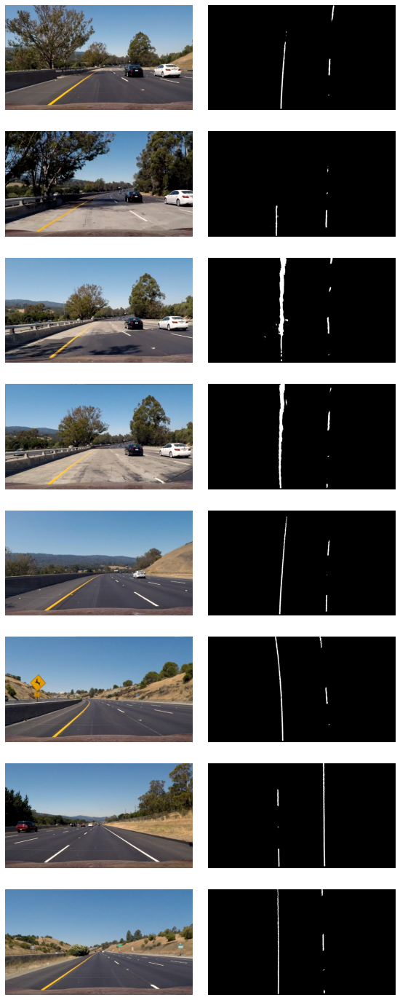

In [1082]:
images = glob.glob('../test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 25))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = color_threshold(img)
    result, M, Minv = unwarp(result, src, dst)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(result, cmap='gray')
    axs[i].axis('off')
    i += 1

the lanes details looks fairly clear.

## Sobel Gradient

Text(0.5, 1.0, 'Gradient Binary')

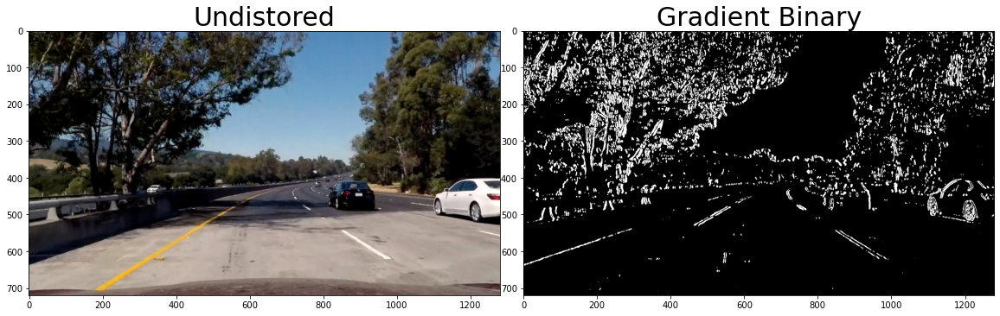

In [1083]:
img = cv2.imread('../test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = cv2.undistort(img, mtx, dist, None, mtx)

# hsv = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(img[:,:,0], cv2.CV_64F, 1, 0, ksize=9) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 30
thresh_max = 140
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
# plt.imshow(combined_binary, cmap='gray')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img, cmap='gray')
ax1.set_title('Undistored', fontsize=30)
ax2.imshow(sxbinary, cmap='gray')
ax2.set_title('Gradient Binary', fontsize=30)

It's interesting that actually the lane details is not kept well after applying X-direction sobel gradient. Let's try Y-direction.

Text(0.5, 1.0, 'Gradient Binary')

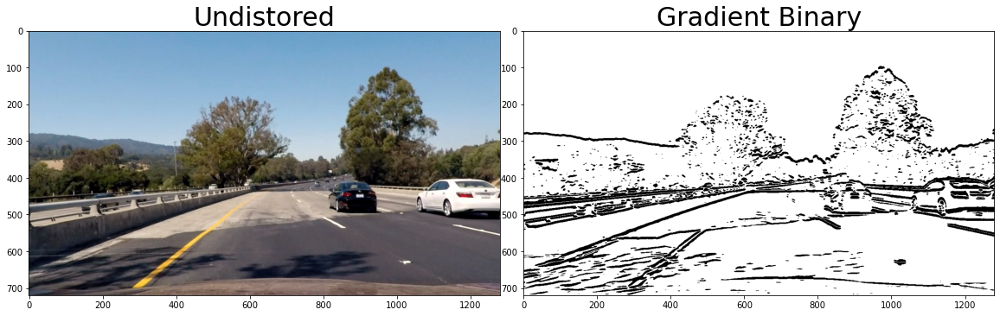

In [1084]:
img = cv2.imread('../test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = cv2.undistort(img, mtx, dist, None, mtx)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel Y
sobelx = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=15) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 0
thresh_max = 30
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
# plt.imshow(combined_binary, cmap='gray')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img, cmap='gray')
ax1.set_title('Undistored', fontsize=30)
ax2.imshow(sxbinary, cmap='gray')
ax2.set_title('Gradient Binary', fontsize=30)

It seems the Y-direction sobel gradient doesn't always work very well on all images either.

### Applying Sobel to the images on both horizontal and vertical direction

In [1085]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=15, thresh=(0, 255)):
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

Text(0.5, 1.0, 'Applying Sobel X and Y on Undist')

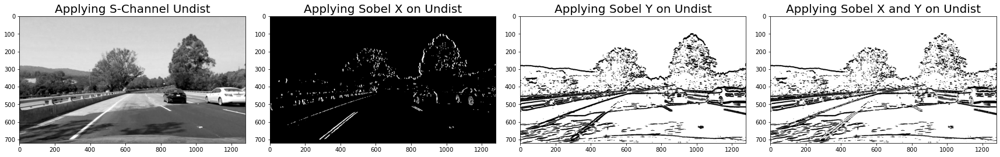

In [1086]:
img = cv2.imread('../test_images/test4.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = cv2.undistort(img, mtx, dist, None, mtx)

img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

v_channel_undist = img[:,:,2]


grad_binary_x_undist = abs_sobel_thresh(v_channel_undist, orient='x', sobel_kernel=15, thresh=(55,140))
grad_binary_y_undist = abs_sobel_thresh(v_channel_undist, orient='y', sobel_kernel=15, thresh=(0,25))
both_x_and_y_undist =  np.zeros_like(grad_binary_y_undist)
both_x_and_y_undist[(grad_binary_x_undist == 1) | (grad_binary_y_undist == 1)] = 1

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(v_channel_undist, cmap='gray')
ax1.set_title('Applying S-Channel Undist', fontsize=20)
ax2.imshow(grad_binary_x_undist, cmap='gray')
ax2.set_title('Applying Sobel X on Undist', fontsize=20)
ax3.imshow(grad_binary_y_undist, cmap='gray')
ax3.set_title('Applying Sobel Y on Undist', fontsize=20)
ax4.imshow(both_x_and_y_undist, cmap='gray')
ax4.set_title('Applying Sobel X and Y on Undist', fontsize=20)


with the combination of both X and Y, the image looks slightly better.

### Sobel Magnitude Threshold

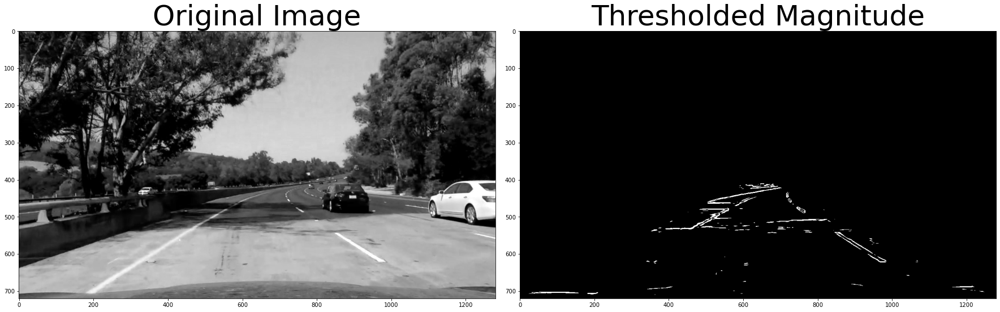

In [1087]:
def mag_thresh(img, sobel_kernel=9, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

# gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
mag_thresh_binary = mag_thresh(image_V, sobel_kernel=9, mag_thresh=(50, 110))

interest_mag_thresh_binary = region_of_interest(mag_thresh_binary,
        [np.array([[(0, h),(w*0.47, h*0.57), (w*0.53, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
unwarp_mag_thresh_binary, M, Minv = unwarp(interest_mag_thresh_binary, src, dst)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_V, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(interest_mag_thresh_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Magnitude thresholding is OK to use since we can see it keeps the lane details. probably we can use it with the direction threshold to remove the horizontal details, so the lanes could be clearer.

### Sobel Direction Threshold

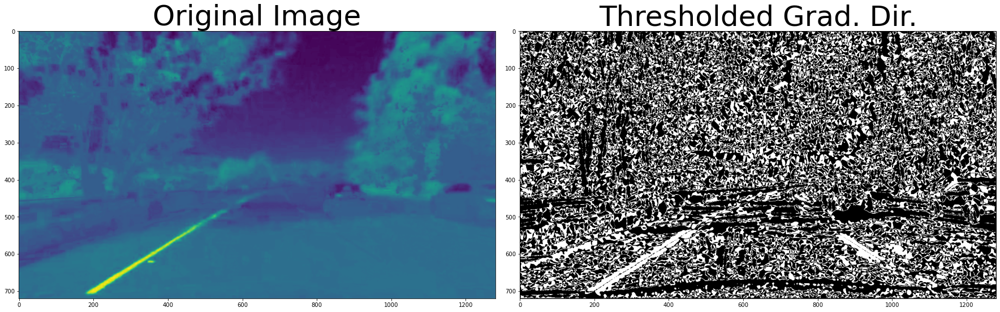

In [1088]:
import numpy as np

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
#     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(direction)
    # 6) Return this mask as your binary_output image
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

dir_binary = dir_threshold(image_V, sobel_kernel=31, thresh=(0.7, 1.3))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_BB)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

(720, 1280, 3)


Text(0.5, 1.0, 'Sobel Magnitude + Direction + Color')

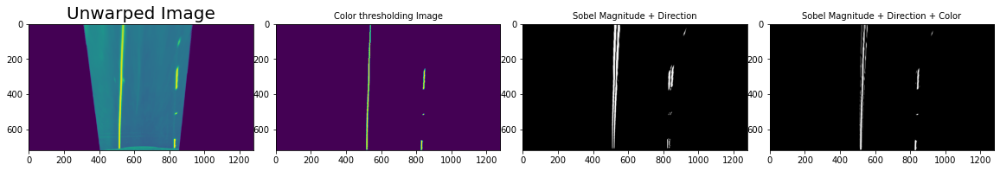

In [1139]:
ksize = 15

img_1 = cv2.imread('./test_bug_2.png')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
img_1 = cv2.resize(img_1,(1280,720))
print(img_1.shape)

img = cv2.undistort(img_1, mtx, dist, None, mtx)

image_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
image_H = image_HSV[:,:,0]
image_S = image_HSV[:,:,1]
image_V = image_HSV[:,:,2]

gradx = abs_sobel_thresh(image_V, orient='x', sobel_kernel=ksize, thresh=(55, 130))
grady = abs_sobel_thresh(image_V, orient='y', sobel_kernel=ksize, thresh=(0, 25))
mag_binary = mag_thresh(image_V, sobel_kernel=ksize, mag_thresh=(55, 100))
dir_binary = dir_threshold(image_S, sobel_kernel=ksize, thresh=(0.7, 1.3))

color_combined_binary = color_threshold(img)

combined = np.zeros_like(dir_binary)
combined[((mag_binary == 1) & (dir_binary == 1) & (gradx == 1) & (grady == 0)) | (color_combined_binary == 1)] = 1

combined = region_of_interest(combined,
        [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
combined, M, Minv = unwarp(combined, src, dst)

color_combined_binary = region_of_interest(color_combined_binary,
        [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
color_combined_binary, M, Minv = unwarp(color_combined_binary, src, dst)

image_V = region_of_interest(image_V,
        [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
image_V, M, Minv = unwarp(image_V, src, dst)

gradient_combined = np.zeros_like(dir_binary)
gradient_combined[((gradx == 1) & (grady == 0))] = 1

gradient_combined = region_of_interest(gradient_combined,
        [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
            dtype=np.int32)]
        )
gradient_combined, M, Minv = unwarp(gradient_combined, src, dst)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(image_V)
ax1.set_title('Unwarped Image', fontsize=20)
ax2.imshow(color_combined_binary)
ax2.set_title('Color thresholding Image', fontsize=10)
ax3.imshow(gradient_combined, cmap='gray')
ax3.set_title('Sobel Magnitude + Direction', fontsize=10)
ax4.imshow(combined, cmap='gray')
ax4.set_title('Sobel Magnitude + Direction + Color', fontsize=10)


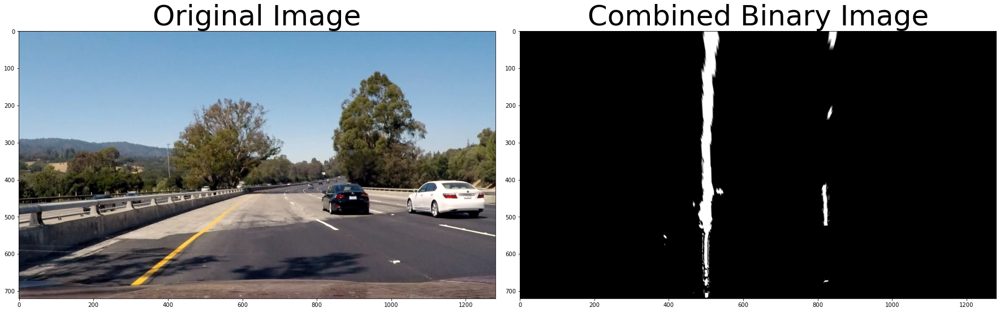

In [1140]:
# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(150, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    image_red = img[:,:,0]
    image_green = img[:,:,1]
    image_blue = img[:,:,2]

    image_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    image_H = image_HLS[:,:,0]
    image_L = image_HLS[:,:,1]
    image_S = image_HLS[:,:,2]
    
    image_HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    image_V = image_HLS[:,:,2]    

    gradx = abs_sobel_thresh(image_V, orient='x', sobel_kernel=15, thresh=(60, 140))
    grady = abs_sobel_thresh(image_V, orient='y', sobel_kernel=15, thresh=(0, 30))
    mag_binary = mag_thresh(image_V, sobel_kernel=15, mag_thresh=(55, 120))
    dir_binary = dir_threshold(image_S, sobel_kernel=15, thresh=(0.7, 1.3))

    color_combined_binary = color_threshold(img) 

    combined = np.zeros_like(dir_binary)
#     combined[((mag_binary == 1) & (dir_binary == 1))] = 255

    # combined[((gradx == 1) & (grady == 0)) | (color_combined_binary == 1)] = 255
    combined[((mag_binary == 1) & (dir_binary == 1) & (gradx == 1) & (grady == 0)) | (color_combined_binary == 1)] = 255 
#     combined = np.zeros_like(image_V)
#     combined[((mag_binary_s == 1) & (dir_binary == 1))] = 1 
    
    combined = region_of_interest(combined,
            [np.array([[(0, h),(w*0.48, h*0.57), (w*0.52, h*0.57), (w, h)]],
                dtype=np.int32)]
            )   

    combined, M, Minv = unwarp(combined, src, dst)    
    
    return combined, Minv
    
img_1 = cv2.imread('../test_images/test4.jpg')
# plt.imshow(img_1)
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
result, Minv = pipeline(img_1) 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_1)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result, cmap='gray')
ax2.set_title('Combined Binary Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### verify the all images 

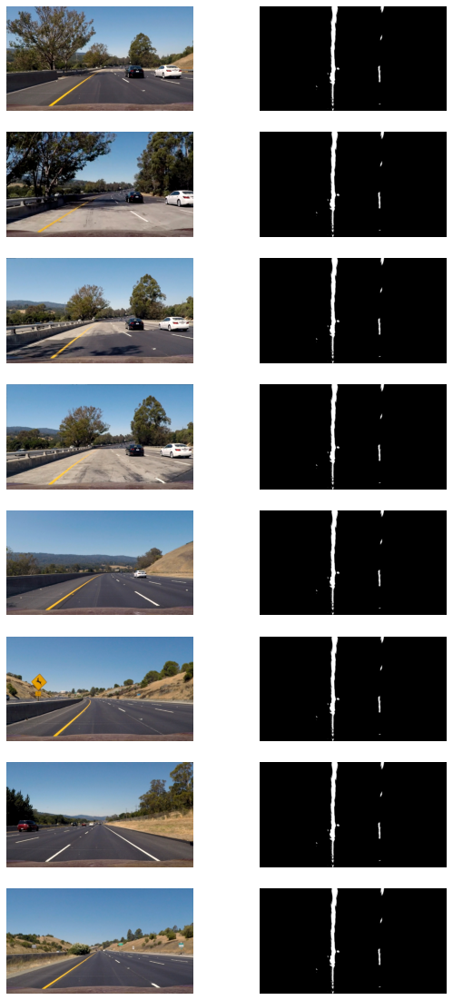

In [1142]:
images = glob.glob('../test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result_img, Minv = pipeline(img)
    plt.imshow(result)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(result, cmap='gray')
    axs[i].axis('off')
    i += 1

## Finding lanes

###  Sliding windows

In [1143]:
def sliding_window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    windows_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        
        windows_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (windows_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data



(720.0, 0.0)

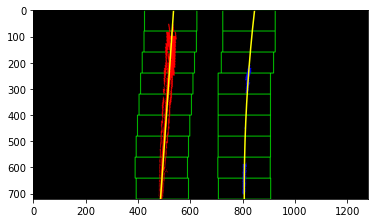

In [1144]:
example_img = cv2.imread('../test_images/test3.jpg')
example_img = cv2.cvtColor(example_img, cv2.COLOR_BGR2RGB)
example_img_binary, Minv = pipeline(example_img)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window_polyfit(example_img_binary)

h = example_img.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
#print('fit x-intercepts:', left_fit_x_int, right_fit_x_int)

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((example_img_binary, example_img_binary, example_img_binary))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, example_img_binary.shape[0]-1, example_img_binary.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = example_img_binary.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [1145]:
# Define method to fit polynomial to binary image based upon a previous fit (chronologically speaking);
# this assumes that the fit will not change significantly from one video frame to the next
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720.0, 0.0)

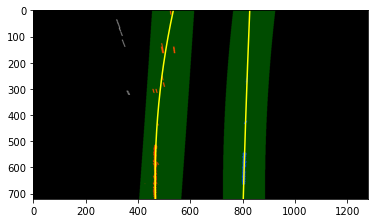

In [1146]:
## # visualize the result on example image
example_img_2 = cv2.imread('../test_images/test5.jpg')
example_img_2 = cv2.cvtColor(example_img_2, cv2.COLOR_BGR2RGB)
example_img_2_binary, Minv = pipeline(example_img_2)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(example_img_2_binary, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, example_img_2_binary.shape[0]-1, example_img_2_binary.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((example_img_2_binary, example_img_2_binary, example_img_2_binary))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = example_img_2_binary.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Compute Curvature

In [1147]:
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

In [1148]:

rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(exampleImg_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 84.59461743173578 m, 536.398541466153 m
Distance from lane center for example: -0.033969520364266405 m


### Draw the line

In [1149]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,255,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

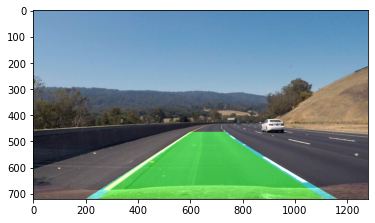

In [1150]:
exampleImg_out1 = draw_lane(example_img, example_img_binary, left_fit, right_fit, Minv)
plt.imshow(exampleImg_out1)

### Draw the curvature data on the image

In [1160]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.3, (255,255,0), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.3, (255,255,0), 2, cv2.LINE_AA)
    return new_img

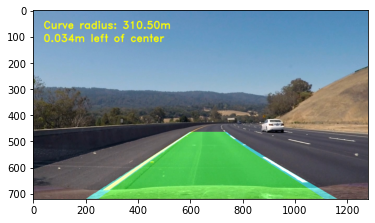

In [1161]:
result_with_curvature = draw_data(exampleImg_out1, (rad_l+rad_r)/2, d_center)
plt.imshow(result_with_curvature)

## Define a line class for storing data

In [1162]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

### Define complete image processing pipeline

In [1163]:
def process_image(img):
    new_img = np.copy(img)
#     plt.imshow(new_img)
    img_bin, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    return img_out

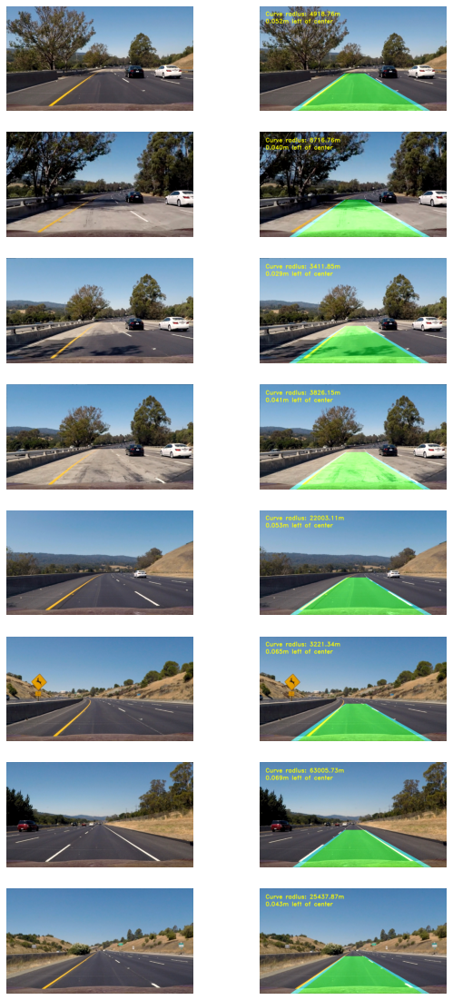

In [1164]:
images = glob.glob('../test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = process_image(img)
    plt.imshow(result)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(result, cmap='gray')
    axs[i].axis('off')
    i += 1

In [1165]:
from moviepy.editor import VideoFileClip

l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = '../project_video_output.mp4'
video_input1 = VideoFileClip('../project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video ../project_video_output.mp4.
Moviepy - Writing video ../project_video_output.mp4



Moviepy - Done !
Moviepy - video ready ../project_video_output.mp4
CPU times: user 3min 47s, sys: 11 s, total: 3min 58s
Wall time: 3min 6s


In [ ]:
l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = '../challenge_video_output.mp4'
video_input1 = VideoFileClip('../challenge_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

t:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

Moviepy - Building video ../challenge_video_output.mp4.
Moviepy - Writing video ../challenge_video_output.mp4



t:  93%|█████████▎| 452/485 [01:07<00:05,  6.43it/s, now=None]